# Análise do dataset "Wine Quality"
### Autor: Victor Barros e Silva dos Reis

References:

https://towardsdatascience.com/red-wine-quality-prediction-using-regression-modeling-and-machine-learning-7a3e2c3e1f46
https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009/code

### Informações sobre o projeto

Dataset (conjunto de dados a ser utilizado) está disponível em:
    https://archive.ics.uci.edu/ml/datasets/Wine+Quality

Data Set Information:

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.


Attribute Information:

Input variables (based on physicochemical tests): <br>
- 1 - fixed acidity
- 2 - volatile acidity
- 3 - citric acid
- 4 - residual sugar
- 5 - chlorides
- 6 - free sulfur dioxide
- 7 - total sulfur dioxide
- 8 - density
- 9 - pH
- 10 - sulphates
- 11 - alcohol

Output variable (based on sensory data): <br>
- 12 - quality (score between 0 and 10)

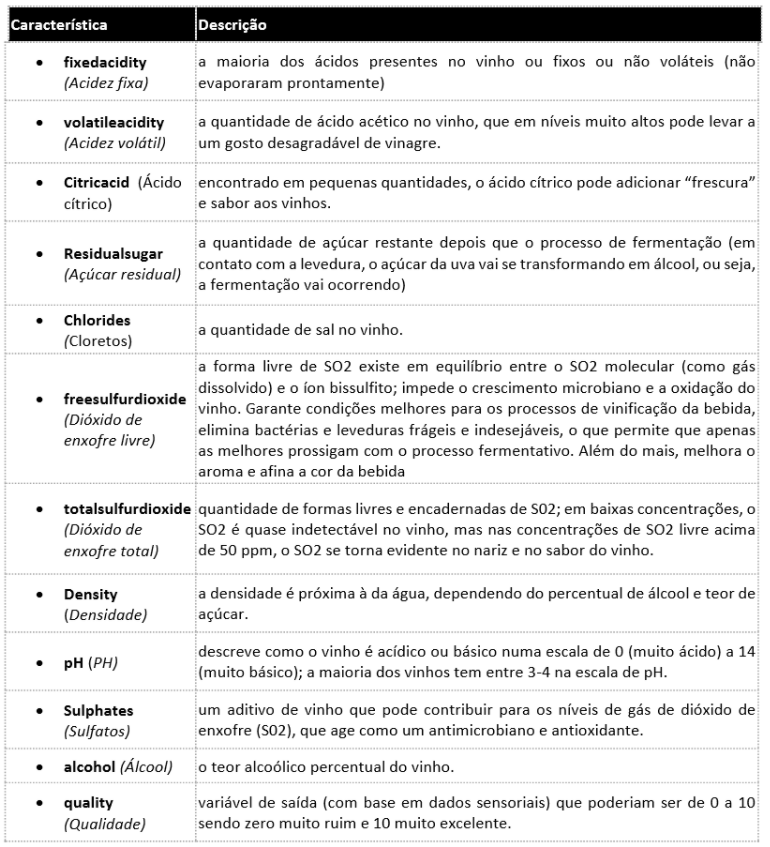

### Etapa 1

**EDA - Análise exploratória de dados**

- Análise das medidas de medidas de posição, dispersão, correlação (análises univaridas e bivariadas) - histograma, boxplot, mapa de calor, etc...
- Exclusão de outliers, caso necessário (sempre explicando a opção)



### Etapa 2

**Regressão Linear**

- Faça um algoritmo que estime a variável “Quality” em função das características físico-químicas dos vinhos
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

### Etapa 3

**Regressão logística**

- Sabendo que os vinhos com notas >= 6 são considerados vinhos de boa qualidade faça um algoritmo que classifique os vinhos em “Bom” ou “Ruim” em função de suas características físico-químicas;
- Colocar comentários sobre a técnica utilizada e análise sobre as variáveis utilizadas, além dos seus respectivos “achados”. Faça uma interpretação do resultado

------------

# Etapa 1 - EDA

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

Temos um dataset para vinhos tintos e um para vinhos brancos. A princípio serão feitas duas análises distintas para cada, tendo em vista que são tipos diferentes de vinho e as características que definem a qualidade de cada um podem ser bastante distintas em cada caso.

In [2]:
df = pd.read_csv('winequality-red.csv', sep=';')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [4]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


Análise de nulos

In [5]:
df.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

Análise de duplicatas

In [6]:
df.duplicated().sum()

240

In [7]:
df=df.drop_duplicates(keep='first')

### Análise de boxplots e outliers

In [8]:
import plotly.express as px

numeric = df.select_dtypes('number').columns
for column in numeric:
    #print(column)
    fig = px.box(df,x=column)
    fig.show()

In [9]:
df['quality'].value_counts()

5    577
6    535
7    167
4     53
8     17
3     10
Name: quality, dtype: int64

In [10]:
df[df['quality']==8]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
267,7.9,0.35,0.46,3.6,0.078,15.0,37.0,0.99730,3.35,0.86,12.8,8
278,10.3,0.32,0.45,6.4,0.073,5.0,13.0,0.99760,3.23,0.82,12.6,8
390,5.6,0.85,0.05,1.4,0.045,12.0,88.0,0.99240,3.56,0.82,12.9,8
440,12.6,0.31,0.72,2.2,0.072,6.0,29.0,0.99870,2.88,0.82,9.8,8
455,11.3,0.62,0.67,5.2,0.086,6.0,19.0,0.99880,3.22,0.69,13.4,8
481,9.4,0.30,0.56,2.8,0.080,6.0,17.0,0.99640,3.15,0.92,11.7,8
495,10.7,0.35,0.53,2.6,0.070,5.0,16.0,0.99720,3.15,0.65,11.0,8
588,5.0,0.42,0.24,2.0,0.060,19.0,50.0,0.99170,3.72,0.74,14.0,8
828,7.8,0.57,0.09,2.3,0.065,34.0,45.0,0.99417,3.46,0.74,12.7,8
1061,9.1,0.40,0.50,1.8,0.071,7.0,16.0,0.99462,3.21,0.69,12.5,8


In [11]:
df[df['quality']==3]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
459,11.6,0.580,0.66,2.20,0.074,10.0,47.0,1.00080,3.25,0.57,9.00,3
517,10.4,0.610,0.49,2.10,0.200,5.0,16.0,0.99940,3.16,0.63,8.40,3
690,7.4,1.185,0.00,4.25,0.097,5.0,14.0,0.99660,3.63,0.54,10.70,3
832,10.4,0.440,0.42,1.50,0.145,34.0,48.0,0.99832,3.38,0.86,9.90,3
899,8.3,1.020,0.02,3.40,0.084,6.0,11.0,0.99892,3.48,0.49,11.00,3
1299,7.6,1.580,0.00,2.10,0.137,5.0,9.0,0.99476,3.50,0.40,10.90,3
1374,6.8,0.815,0.00,1.20,0.267,16.0,29.0,0.99471,3.32,0.51,9.80,3
1469,7.3,0.980,0.05,2.10,0.061,20.0,49.0,0.99705,3.31,0.55,9.70,3
1478,7.1,0.875,0.05,5.70,0.082,3.0,14.0,0.99808,3.40,0.52,10.20,3
1505,6.7,0.760,0.02,1.80,0.078,6.0,12.0,0.99600,3.55,0.63,9.95,3


Visualizar a distribuição das notas de qualidade:

In [12]:
import plotly.express as px

fig=px.histogram( data_frame=df,
            x=df['quality'],
            color=df['quality'],
            title="Distribuição da variável - Qualidade")
fig.show()

#### Devido aos outliers constatados no boxplot, será considerado um dataset sem outliers superiores de todas as variáveis, excetuando-se o 'alcohol' e 'quality'

In [13]:
fixed_acidity_q1 = df['fixed acidity'].quantile(0.25)
fixed_acidity_q3 = df['fixed acidity'].quantile(0.75)
iqr = fixed_acidity_q3 - fixed_acidity_q1
lim_inf = fixed_acidity_q1 - 1.5*iqr
lim_sup = fixed_acidity_q3 + 1.5*iqr

print('Avaliando os Outliers:')
print('Primeiro Quartil: ', fixed_acidity_q1)
print('Terceiro Quartil: ', fixed_acidity_q3)
print('IQR:              ', iqr)
print('Limite Inferior:  ', lim_inf)
print('Limite Superior:  ', lim_sup)

df_fix = df[df['fixed acidity'] < lim_sup]

Avaliando os Outliers:
Primeiro Quartil:  7.1
Terceiro Quartil:  9.2
IQR:               2.0999999999999996
Limite Inferior:   3.95
Limite Superior:   12.349999999999998


In [14]:
for column in df_fix.columns:
    if column != 'fixed acidity' and column != 'alcohol' and column != 'quality':
        q1 = df_fix[column].quantile(0.25)
        q3 = df_fix[column].quantile(0.75)
        iqr = q3 - q1
        lim_inf = q1 - 1.5*iqr
        lim_sup = q3 + 1.5*iqr

        df_fix = df_fix[df_fix[column] < lim_sup]

In [15]:
import plotly.express as px

numeric = df_fix.select_dtypes('number').columns
for column in numeric:
    #print(column)
    fig = px.box(df_fix,x=column)
    fig.show()

In [16]:
df_fix.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1004 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1004 non-null   float64
 1   volatile acidity      1004 non-null   float64
 2   citric acid           1004 non-null   float64
 3   residual sugar        1004 non-null   float64
 4   chlorides             1004 non-null   float64
 5   free sulfur dioxide   1004 non-null   float64
 6   total sulfur dioxide  1004 non-null   float64
 7   density               1004 non-null   float64
 8   pH                    1004 non-null   float64
 9   sulphates             1004 non-null   float64
 10  alcohol               1004 non-null   float64
 11  quality               1004 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 102.0 KB


### Visualizações

#### Pairplot com hue sendo a variável target, prática recomendada em problemas de classificação

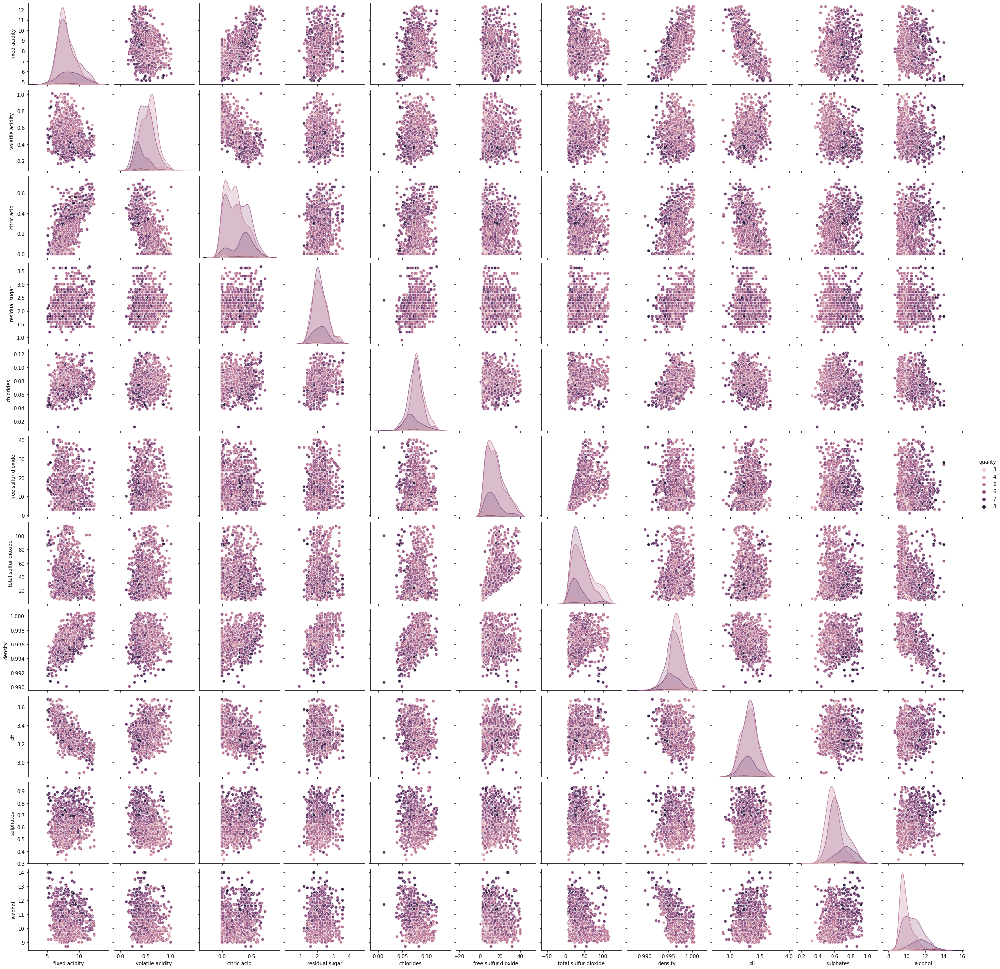

In [17]:
sns.pairplot(df_fix, hue='quality')

Podemos observar pelo pairplot que, com exceção do teor alcoólico, não há nenhuma variável de forma aparente e individual que consegue separar nossos dados, sendo as mais evidentes os sulfatos e a densidade.

In [18]:
df_fix.corr()['quality']

fixed acidity           0.104907
volatile acidity       -0.356915
citric acid             0.231696
residual sugar          0.025455
chlorides              -0.208761
free sulfur dioxide     0.001159
total sulfur dioxide   -0.156402
density                -0.252830
pH                     -0.062954
sulphates               0.448641
alcohol                 0.521629
quality                 1.000000
Name: quality, dtype: float64

<AxesSubplot:>

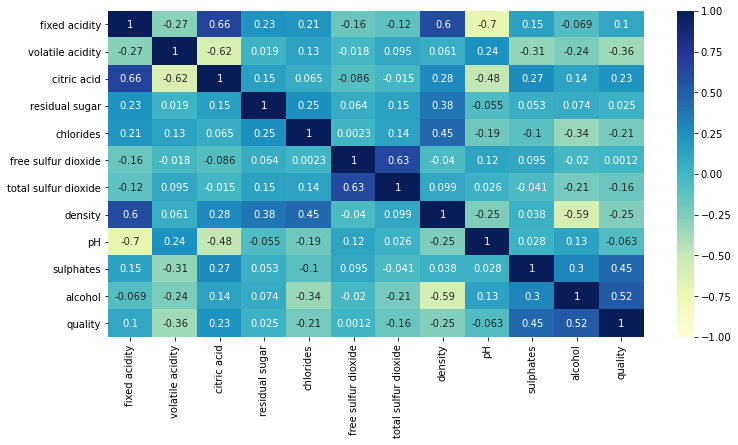

In [19]:
plt.figure(figsize=(12, 6))
sns.heatmap(df_fix.corr(), vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

Utilizando a função 'corr()', é possível perceber que o 'alcohol' é a variável que mais influencia na qualidade, seguido da  'sulphates', 'volatile acidity' e 'density'

# Etapa 2 - Regressão linear
### Regressão múltipla

In [20]:
df_fix

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [21]:
X = df_fix.drop(['quality'], axis = 1)
y = df_fix['quality']

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

In [23]:
std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

In [24]:
linreg = LinearRegression() # instanciar modelo
linreg.fit(X_train_std, y_train) # fit dos dados

y_pred = linreg.predict(X_test_std)

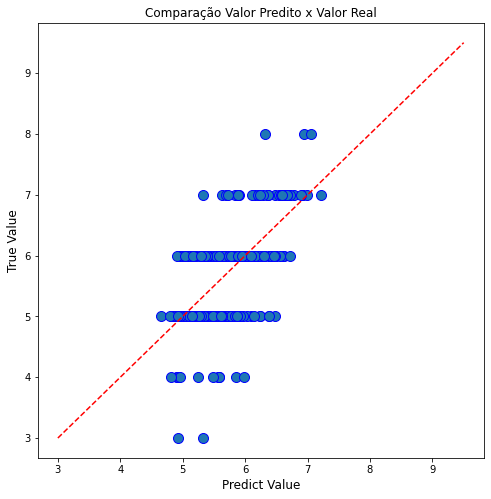

In [25]:
# Comparação dos Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

In [26]:
# Métricas
print('Métricas para a Previsão')
print('Erro Absoluto Médio:', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrático Médio:', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:', np.round(r2_score(y_test, y_pred), 3))

Métricas para a Previsão
Erro Absoluto Médio: 0.507
Erro Quadrático Médio: 0.418
R^2: 0.331


Fazendo o treinamento do modelo considerando apenas as variáveis mais relevantes apontadas segundo a correlação, temos os seguintes resultados:

In [27]:
df_fix.corr()['quality']

fixed acidity           0.104907
volatile acidity       -0.356915
citric acid             0.231696
residual sugar          0.025455
chlorides              -0.208761
free sulfur dioxide     0.001159
total sulfur dioxide   -0.156402
density                -0.252830
pH                     -0.062954
sulphates               0.448641
alcohol                 0.521629
quality                 1.000000
Name: quality, dtype: float64

In [28]:
X = df_fix[['alcohol','sulphates','density','volatile acidity','citric acid','chlorides']]
y = df_fix['quality']

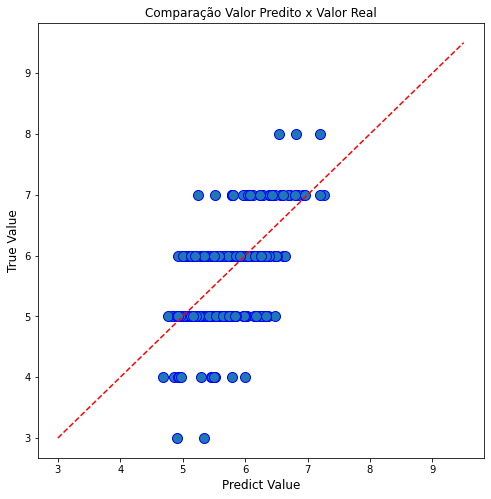

Métricas para a Previsão
Erro Absoluto Médio: 0.516
Erro Quadrático Médio: 0.417
R^2: 0.332


In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

linreg = LinearRegression() # instanciar modelo
linreg.fit(X_train_std, y_train) # fit dos dados

y_pred = linreg.predict(X_test_std)

# Comparação dos Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

# Métricas
print('Métricas para a Previsão')
print('Erro Absoluto Médio:', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrático Médio:', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:', np.round(r2_score(y_test, y_pred), 3))

#### Regressão para o dataset original, com outliers

<AxesSubplot:>

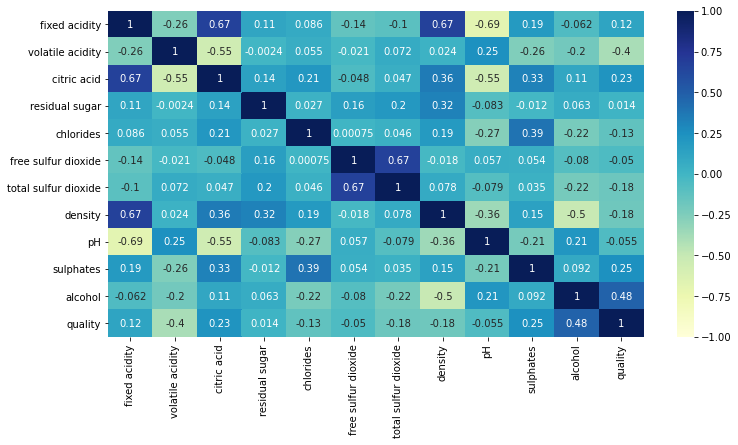

In [30]:
plt.figure(figsize=(12, 6))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

In [31]:
X = df.drop(['quality'], axis = 1)
y = df['quality']

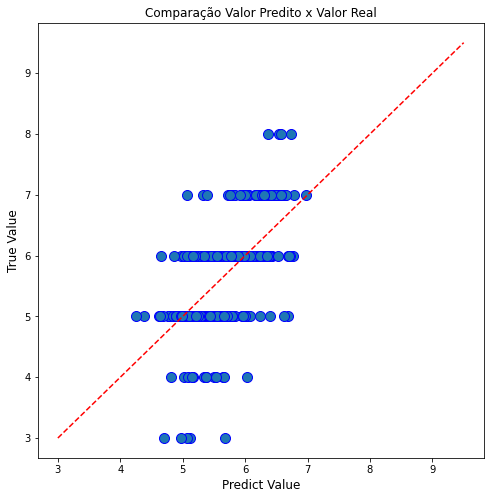

Métricas para a Previsão
Erro Absoluto Médio: 0.494
Erro Quadrático Médio: 0.419
R^2: 0.382


In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

linreg = LinearRegression() # instanciar modelo
linreg.fit(X_train_std, y_train) # fit dos dados

y_pred = linreg.predict(X_test_std)

# Comparação dos Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

# Métricas
print('Métricas para a Previsão')
print('Erro Absoluto Médio:', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrático Médio:', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:', np.round(r2_score(y_test, y_pred), 3))

Fazendo o treinamento do modelo considerando apenas as variáveis mais relevantes:

In [33]:
X = df[['alcohol','sulphates','density','volatile acidity','citric acid','chlorides']]
y = df['quality']

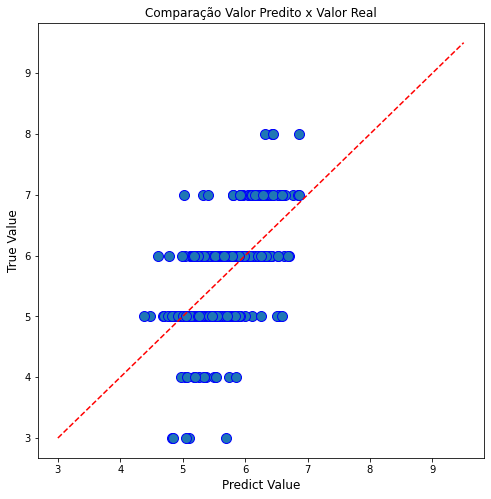

Métricas para a Previsão
Erro Absoluto Médio: 0.492
Erro Quadrático Médio: 0.409
R^2: 0.396


In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

linreg = LinearRegression() # instanciar modelo
linreg.fit(X_train_std, y_train) # fit dos dados

y_pred = linreg.predict(X_test_std)

# Comparação dos Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

# Métricas
print('Métricas para a Previsão')
print('Erro Absoluto Médio:', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrático Médio:', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:', np.round(r2_score(y_test, y_pred), 3))

Em resumo, foi testado o modelo para 4 cenários distintos, e temos os resultados apresentados abaixo:

- **Com outliers e todas as variáveis**

Erro Absoluto Médio: 0.494

Erro Quadrático Médio: 0.419

R²: 0.382


- **Com outliers e somente variáveis mais relevantes**

Erro Absoluto Médio: 0.492

Erro Quadrático Médio: 0.409

R²: 0.396


- **Sem outliers e todas as variáveis**

Erro Absoluto Médio: 0.507

Erro Quadrático Médio: 0.418

R²: 0.331


- **Sem outliers e somente variáveis mais relevantes**

Erro Absoluto Médio: 0.516

Erro Quadrático Médio: 0.417

R²: 0.332

Apesar dos resultados serem semelhantes e longe de um resultado ajustado, o modelo que apresentou scores levemente superiores é quando se leva em conta o dataset original e contendo somente apenas as variáveis com maior correlação com a qualidade. Seguiremos com a regressão logística aplicada a esse cenário.

### Regularização (L1, L2, L1+L2)

Serão testados os modelos Ridge, Lasso e ElasticNet para avaliar se há melhoria do R2 em comparação com o modelo original. Um loop testará também diferentes valores de lambda para comparação do R2

In [36]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

for alpha in np.linspace(0.5 , 2 , 4):
    ridge = Ridge(alpha=alpha)
    ridge.fit(X_train_std, y_train)
    y_pred_ridge = ridge.predict(X_test_std)

    R2_ridge = r2_score(y_test, y_pred_ridge)
    print(f'R2 - Ridge (lambda={alpha}):', np.round(R2_ridge, 4))

    # visualização de coeficientes
    coefs2 = ridge.coef_

    list_columns = X_train.columns
    list_feature = []
    list_score = []

    for i, v in enumerate(coefs2):
        list_feature.append(list_columns[i])
        list_score.append(v)

    dictionary = {'Features': list_feature,
                  'Scores': list_score}

    df_features2 = pd.DataFrame(dictionary)
    df_features2 = df_features2.sort_values(by=['Scores'], ascending=False)
    df_features2.reset_index(inplace=True, drop=True)
    display(df_features2)
    print('\n')

R2 - Ridge (lambda=0.5): 0.3958


,Features,Scores
0,alcohol,0.313872
1,sulphates,0.155752
2,citric acid,0.015280
3,density,0.012562
4,chlorides,-0.075137
5,volatile acidity,-0.197436




R2 - Ridge (lambda=1.0): 0.3957


,Features,Scores
0,alcohol,0.313614
1,sulphates,0.155699
2,citric acid,0.015478
3,density,0.012353
4,chlorides,-0.075148
5,volatile acidity,-0.197283




R2 - Ridge (lambda=1.5): 0.3957


,Features,Scores
0,alcohol,0.313356
1,sulphates,0.155647
2,citric acid,0.015674
3,density,0.012145
4,chlorides,-0.075159
5,volatile acidity,-0.197131




R2 - Ridge (lambda=2.0): 0.3957


,Features,Scores
0,alcohol,0.313098
1,sulphates,0.155594
2,citric acid,0.015869
3,density,0.011938
4,chlorides,-0.075170
5,volatile acidity,-0.196979


In [37]:
for alpha in np.linspace(0.5 , 2 , 4):
    lasso = Lasso(alpha=alpha)
    lasso.fit(X_train_std, y_train)
    y_pred_lasso = lasso.predict(X_test_std)

    R2_lasso = r2_score(y_test, y_pred_lasso)
    print(f'R2 - Lasso (lambda={alpha}):', np.round(R2_lasso, 4))


    coefs3 = lasso.coef_

    list_columns = X_train.columns
    list_feature = []
    list_score = []

    for i, v in enumerate(coefs3):
        list_feature.append(list_columns[i])
        list_score.append(v)

    dictionary = {'Features': list_feature,
                  'Scores': list_score}

    df_features3 = pd.DataFrame(dictionary)
    df_features3 = df_features3.sort_values(by=['Scores'], ascending=False)
    df_features3.reset_index(inplace=True, drop=True)
    display(df_features3)
    print('\n')

R2 - Lasso (lambda=0.5): -0.0


,Features,Scores
0,alcohol,0.0
1,sulphates,0.0
2,density,-0.0
3,volatile acidity,-0.0
4,citric acid,0.0
5,chlorides,-0.0




R2 - Lasso (lambda=1.0): -0.0


,Features,Scores
0,alcohol,0.0
1,sulphates,0.0
2,density,-0.0
3,volatile acidity,-0.0
4,citric acid,0.0
5,chlorides,-0.0




R2 - Lasso (lambda=1.5): -0.0


,Features,Scores
0,alcohol,0.0
1,sulphates,0.0
2,density,-0.0
3,volatile acidity,-0.0
4,citric acid,0.0
5,chlorides,-0.0




R2 - Lasso (lambda=2.0): -0.0


,Features,Scores
0,alcohol,0.0
1,sulphates,0.0
2,density,-0.0
3,volatile acidity,-0.0
4,citric acid,0.0
5,chlorides,-0.0


In [38]:
for alpha in np.linspace(0.5 , 2 , 4):
    EN = ElasticNet(alpha=alpha)
    EN.fit(X_train_std, y_train)
    y_pred_EN = EN.predict(X_test_std)

    R2_EN = r2_score(y_test, y_pred_EN)
    print(f'R2 - ElasticNet (lambda={alpha}):', np.round(R2_EN, 4))


    coefs4 = EN.coef_

    list_columns = X_train.columns
    list_feature = []
    list_score = []

    for i, v in enumerate(coefs4):
        list_feature.append(list_columns[i])
        list_score.append(v)

    dictionary = {'Features': list_feature,
                  'Scores': list_score}

    df_features4 = pd.DataFrame(dictionary)
    df_features4 = df_features2.sort_values(by=['Scores'], ascending=False)
    df_features4.reset_index(inplace=True, drop=True)
    display(df_features4)
    print('\n')

R2 - ElasticNet (lambda=0.5): 0.1464


,Features,Scores
0,alcohol,0.313098
1,sulphates,0.155594
2,citric acid,0.015869
3,density,0.011938
4,chlorides,-0.075170
5,volatile acidity,-0.196979




R2 - ElasticNet (lambda=1.0): -0.0


,Features,Scores
0,alcohol,0.313098
1,sulphates,0.155594
2,citric acid,0.015869
3,density,0.011938
4,chlorides,-0.075170
5,volatile acidity,-0.196979




R2 - ElasticNet (lambda=1.5): -0.0


,Features,Scores
0,alcohol,0.313098
1,sulphates,0.155594
2,citric acid,0.015869
3,density,0.011938
4,chlorides,-0.075170
5,volatile acidity,-0.196979




R2 - ElasticNet (lambda=2.0): -0.0


,Features,Scores
0,alcohol,0.313098
1,sulphates,0.155594
2,citric acid,0.015869
3,density,0.011938
4,chlorides,-0.075170
5,volatile acidity,-0.196979


Observa-se que o Ridge apresentou resultado bem semelhante à regressão padrão, mesmo variando-se o lambda. Por isso, optamos por manter o modelo original.

# Etapa 3 - Regressão logística
### Regressão logística

Primeiramente, precisamos classificar nossos vinhos dentre "bom" ou "ruim", e para isso como temos 6 valores distintos para qualidade no nosso dataset, serão definidas notas de 1 até 5 como "ruins" e de 6 para cima como "boas"

In [39]:
df['rating'] = np.where(
    df['quality'].isin(range(1,6)),
    0, # ruim
    1 # bom
)

In [40]:
df["rating"].value_counts(normalize=True)

1    0.529065
0    0.470935
Name: rating, dtype: float64

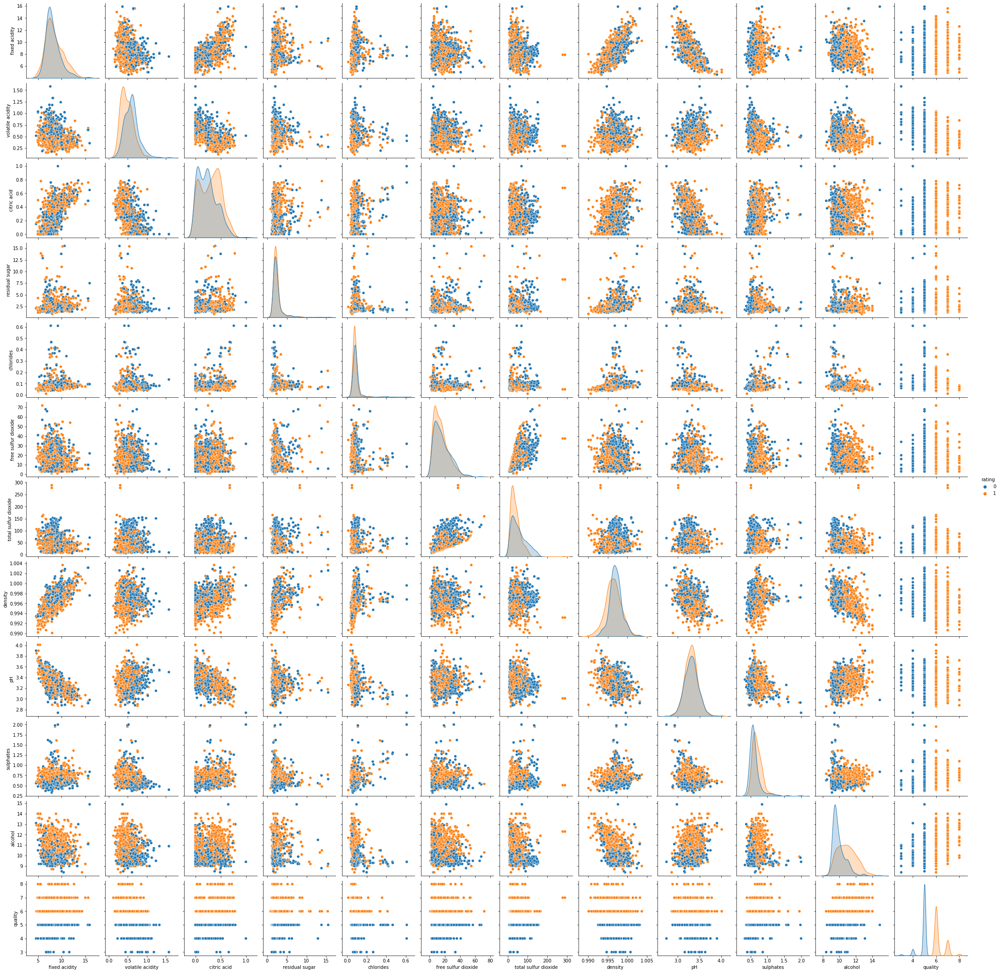

In [41]:
sns.pairplot(df, hue="rating")
plt.show()

As classificações dos vinhos estão bem distribuidas, segundo o critério estabelecido, apesar de ser difícil notar distinções muito claras pelo pairplot, então prosseguiremos para o modelo de regressão logística:

In [42]:
X = df[['alcohol','sulphates','density','volatile acidity','citric acid','chlorides']]
y = df['rating']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

In [43]:
model = LogisticRegression()
model.fit(X_train_std, y_train)
y_pred = model.predict(X_test_std)

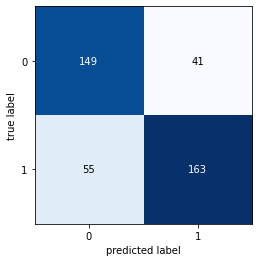

In [44]:
# Bibliotecas para a matriz de confusão
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

# Cria a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plot do gráfico
plot_confusion_matrix(conf_mat=cm)
plt.show()

In [45]:
from sklearn.metrics import accuracy_score
print('Accuracy:', accuracy_score(y_test, y_pred))

from sklearn.metrics import precision_score
print('Precision score:', precision_score(y_test, y_pred))

from sklearn.metrics import recall_score
print('Recall score:', recall_score(y_test, y_pred))

from sklearn.metrics import f1_score
print('F1 Score:', f1_score(y_test, y_pred))

print('\n')
# Classification report
from sklearn.metrics import classification_report

# Print classification report after a train/test split:
print(classification_report(y_test, y_pred))

Accuracy: 0.7647058823529411
Precision score: 0.7990196078431373
Recall score: 0.7477064220183486
F1 Score: 0.7725118483412322


              precision    recall  f1-score   support

           0       0.73      0.78      0.76       190
           1       0.80      0.75      0.77       218

    accuracy                           0.76       408
   macro avg       0.76      0.77      0.76       408
weighted avg       0.77      0.76      0.76       408



Conforme visto na matriz de confusão e nas métricas de score, nosso modelo consegue de forma satisfatória classificar os vinhos dentre bons ou ruins.

### Análise para o dataset de vinhos brancos

In [46]:
df_white = pd.read_csv('winequality-white.csv', sep=';')
df_white.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [47]:
df_white.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


In [48]:
df_white.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


In [49]:
df_white.isna().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [50]:
df_white.duplicated().sum()

937

In [51]:
df_white=df_white.drop_duplicates(keep='first')

In [52]:
import plotly.express as px

numeric = df_white.select_dtypes('number').columns
for column in numeric:
    #print(column)
    fig = px.box(df_white,x=column)
    fig.show()

Distribuição das notas de qualidade:

In [53]:
import plotly.express as px

fig=px.histogram( data_frame=df_white,
            x=df_white['quality'],
            color=df_white['quality'],
            title="Distribuição da variável - Qualidade")
fig.show()

Pairplot e correlação

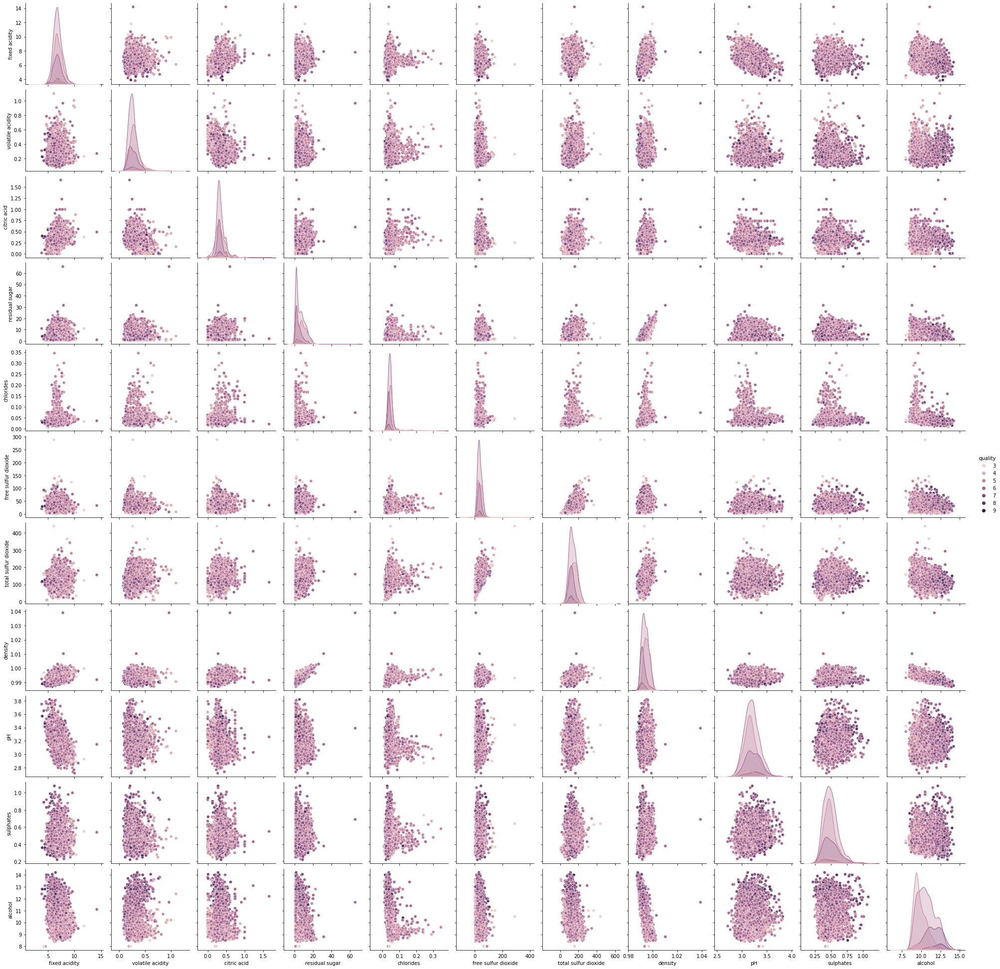

In [54]:
sns.pairplot(df_white, hue='quality')

<AxesSubplot:>

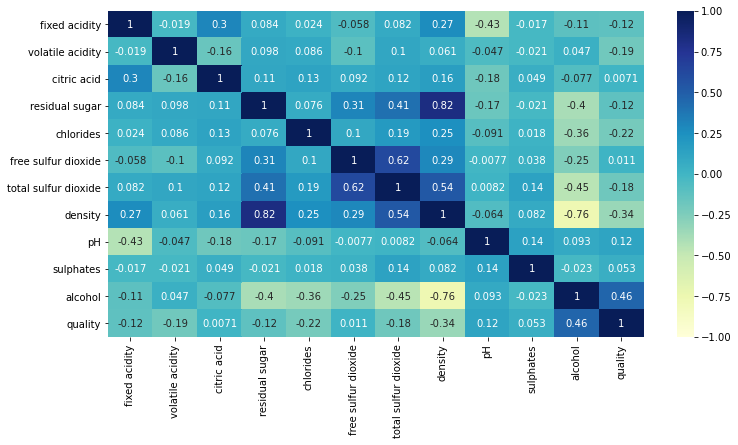

In [55]:
plt.figure(figsize=(12, 6))
sns.heatmap(df_white.corr(), vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

No caso dos vinhos brancos, menos variáveis tem correlação significativa com a qualidade, sendo elas o 'alcohol', 'density' e 'chlorides'

Regressão linear:

In [56]:
X = df_white.drop(['quality'], axis = 1)
#X = df_white[['alcohol','density','chlorides']]
y = df_white['quality']

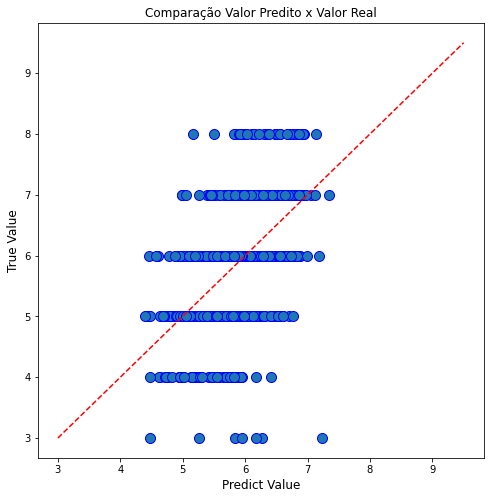

Métricas para a Previsão
Erro Absoluto Médio: 0.586
Erro Quadrático Médio: 0.574
R^2: 0.272


In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

linreg = LinearRegression() # instanciar modelo
linreg.fit(X_train_std, y_train) # fit dos dados

y_pred = linreg.predict(X_test_std)

# Comparação dos Valores Reais com os Preditos
fig = plt.figure(figsize=(8,8))
l = plt.plot(y_pred, y_test, 'bo')
plt.setp(l, markersize=10)
plt.setp(l, markerfacecolor='C0')
plt.title('Comparação Valor Predito x Valor Real', fontsize=12)
plt.ylabel("True Value", fontsize=12)
plt.xlabel("Predict Value", fontsize=12)

xl = np.arange(min(y_test), 1.2*max(y_test),(max(y_test)-min(y_test))/10)
yl = xl
plt.plot(xl, yl, 'r--')
plt.show()

# Métricas
print('Métricas para a Previsão')
print('Erro Absoluto Médio:', np.round(mean_absolute_error(y_test, y_pred), 3))
print('Erro Quadrático Médio:', np.round(mean_squared_error(y_test, y_pred), 3))
print('R^2:', np.round(r2_score(y_test, y_pred), 3))

Neste caso, o modelo foi testado com diversos conjuntos de variáveis, e os resultados apresentados abaixo:

- **Utilizando-se as mesmas variáveis para o dataset de vinhos tinto:**

Erro Absoluto Médio: 0.606

Erro Quadrático Médio: 0.606

R^2: 0.232
    
    
- **Variáveis mais relevantes segundo .corr()**

Erro Absoluto Médio: 0.621

Erro Quadrático Médio: 0.63

R^2: 0.202
    
    
- **Todas as variáveis**


Erro Absoluto Médio: 0.586

Erro Quadrático Médio: 0.574

R^2: 0.272

Aqui, diferentemente do outro dataset, observou-se que utilizando-se todas as variáveis o resultado é melhor, mas no caso dos vinhos brancos o modelo é menos eficaz em predizer as notas dos vinhos. Também foi testado o modelo sem outliers, mas com resultados insatisfatórios.

Regressão logística:


In [58]:
df_white['rating'] = np.where(
    df_white['quality'].isin(range(1,6)),
    0, # ruim
    1 # bom
)

In [59]:
df_white["rating"].value_counts(normalize=True)

1    0.659682
0    0.340318
Name: rating, dtype: float64

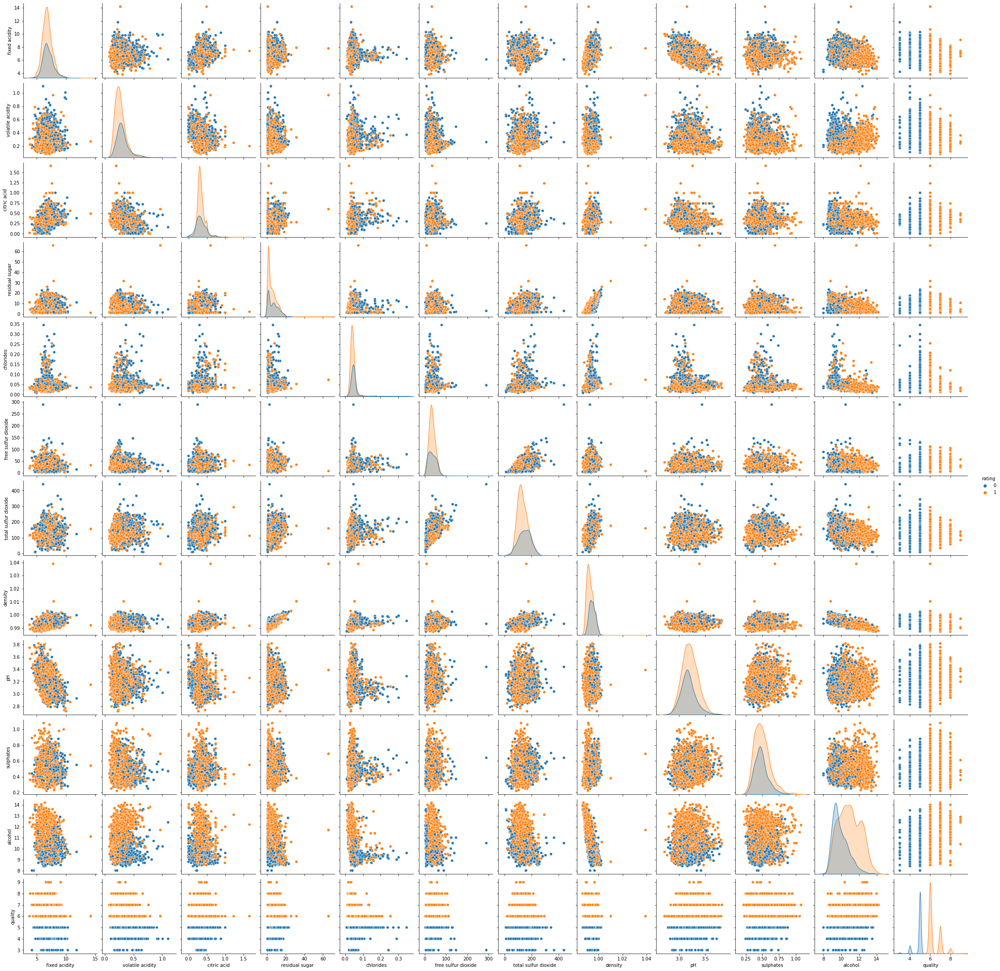

In [60]:
sns.pairplot(df_white, hue="rating")
plt.show()

In [61]:
X = df_white.drop(['rating','quality'], axis = 1)
y = df_white['rating']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

std = StandardScaler()
X_train_std = std.fit_transform(X_train)
X_test_std = std.transform(X_test)

model = LogisticRegression()
model.fit(X_train_std, y_train)
y_pred = model.predict(X_test_std)

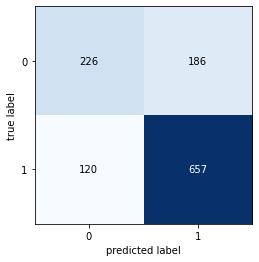

In [62]:
# Cria a matriz de confusão
cm = confusion_matrix(y_test, y_pred)

# Plot do gráfico
plot_confusion_matrix(conf_mat=cm)
plt.show()

In [63]:
print('Accuracy:', accuracy_score(y_test, y_pred))
print('Precision score:', precision_score(y_test, y_pred))
print('Recall score:', recall_score(y_test, y_pred))
from sklearn.metrics import f1_score
print('F1 Score:', f1_score(y_test, y_pred))

print('\n')
print(classification_report(y_test, y_pred))

Accuracy: 0.7426408746846089
Precision score: 0.7793594306049823
Recall score: 0.8455598455598455
F1 Score: 0.8111111111111111


              precision    recall  f1-score   support

           0       0.65      0.55      0.60       412
           1       0.78      0.85      0.81       777

    accuracy                           0.74      1189
   macro avg       0.72      0.70      0.70      1189
weighted avg       0.74      0.74      0.74      1189



Por fim, na regressão logística vemos que o modelo é especialmente eficaz em classificar bons vinhos brancos corretamente, apesar de haver um grande número de falsos positivos (FP) e falsos negativos (FN) em relação a verdadeiros negativos (TN).